# Analysis of Merged Accident and Strava Data

Reading and basic analysis of `data/merged/berlin_bike_accident_strava_panel.parquet`.

In [ ]:
# required imports
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

# set project root
from pathlib import Path
import sys

import folium
import branca.colormap as cm
from IPython.display import display



In [ ]:
PROJECT_ROOT = Path.cwd().parent
sys.path.append(str(PROJECT_ROOT))

# Load Parquet file
file_path = "../data/merged/berlin_bike_accident_strava_panel.parquet"
df = gpd.read_parquet(file_path)

print(f"Loaded: {df.shape}, CRS: {df.crs}")
print(f"Columns: {list(df.columns)}")


print(f"counter_name unique: {df.counter_name.nunique()}")
print(f"counter_name with traffic (sum_strava_ride_count) unique: {df[df.sum_strava_ride_count > 0].counter_name.nunique()}")

Loaded: (297480, 204), CRS: {"$schema": "https://proj.org/schemas/v0.7/projjson.schema.json", "type": "ProjectedCRS", "name": "WGS 84 / UTM zone 33N", "base_crs": {"name": "WGS 84", "datum_ensemble": {"name": "World Geodetic System 1984 ensemble", "members": [{"name": "World Geodetic System 1984 (Transit)"}, {"name": "World Geodetic System 1984 (G730)"}, {"name": "World Geodetic System 1984 (G873)"}, {"name": "World Geodetic System 1984 (G1150)"}, {"name": "World Geodetic System 1984 (G1674)"}, {"name": "World Geodetic System 1984 (G1762)"}, {"name": "World Geodetic System 1984 (G2139)"}, {"name": "World Geodetic System 1984 (G2296)"}], "ellipsoid": {"name": "WGS 84", "semi_major_axis": 6378137, "inverse_flattening": 298.257223563}, "accuracy": "2.0", "id": {"authority": "EPSG", "code": 6326}}, "coordinate_system": {"subtype": "ellipsoidal", "axis": [{"name": "Geodetic latitude", "abbreviation": "Lat", "direction": "north", "unit": "degree"}, {"name": "Geodetic longitude", "abbreviatio

In [ ]:
# Load Parquet file
file_path = "../data/merged/berlin_bike_accident_strava_risk_core_panel.parquet"
df = gpd.read_parquet(file_path)

print(f"Loaded: {df.shape}, CRS: {df.crs}")
print(f"Columns: {list(df.columns)}")


Loaded: (297480, 66), CRS: {"$schema": "https://proj.org/schemas/v0.7/projjson.schema.json", "type": "ProjectedCRS", "name": "WGS 84 / UTM zone 33N", "base_crs": {"name": "WGS 84", "datum_ensemble": {"name": "World Geodetic System 1984 ensemble", "members": [{"name": "World Geodetic System 1984 (Transit)"}, {"name": "World Geodetic System 1984 (G730)"}, {"name": "World Geodetic System 1984 (G873)"}, {"name": "World Geodetic System 1984 (G1150)"}, {"name": "World Geodetic System 1984 (G1674)"}, {"name": "World Geodetic System 1984 (G1762)"}, {"name": "World Geodetic System 1984 (G2139)"}, {"name": "World Geodetic System 1984 (G2296)"}], "ellipsoid": {"name": "WGS 84", "semi_major_axis": 6378137, "inverse_flattening": 298.257223563}, "accuracy": "2.0", "id": {"authority": "EPSG", "code": 6326}}, "coordinate_system": {"subtype": "ellipsoidal", "axis": [{"name": "Geodetic latitude", "abbreviation": "Lat", "direction": "north", "unit": "degree"}, {"name": "Geodetic longitude", "abbreviation

In [ ]:
# Load Parquet file
file_path = "../data/merged/berlin_bike_accident_strava_risk_core_panel.parquet"
df = gpd.read_parquet(file_path)

print(f"Loaded: {df.shape}, CRS: {df.crs}")
print(f"Columns: {list(df.columns)}")


file_path = "../data/merged/berlin_bike_accident_node_panel.parquet"
df = pd.read_parquet(file_path)
print(f"Loaded: {df.shape}")
print(f"Columns: {list(df.columns)}")


Loaded: (297480, 66), CRS: {"$schema": "https://proj.org/schemas/v0.7/projjson.schema.json", "type": "ProjectedCRS", "name": "WGS 84 / UTM zone 33N", "base_crs": {"name": "WGS 84", "datum_ensemble": {"name": "World Geodetic System 1984 ensemble", "members": [{"name": "World Geodetic System 1984 (Transit)"}, {"name": "World Geodetic System 1984 (G730)"}, {"name": "World Geodetic System 1984 (G873)"}, {"name": "World Geodetic System 1984 (G1150)"}, {"name": "World Geodetic System 1984 (G1674)"}, {"name": "World Geodetic System 1984 (G1762)"}, {"name": "World Geodetic System 1984 (G2139)"}, {"name": "World Geodetic System 1984 (G2296)"}], "ellipsoid": {"name": "WGS 84", "semi_major_axis": 6378137, "inverse_flattening": 298.257223563}, "accuracy": "2.0", "id": {"authority": "EPSG", "code": 6326}}, "coordinate_system": {"subtype": "ellipsoidal", "axis": [{"name": "Geodetic latitude", "abbreviation": "Lat", "direction": "north", "unit": "degree"}, {"name": "Geodetic longitude", "abbreviation

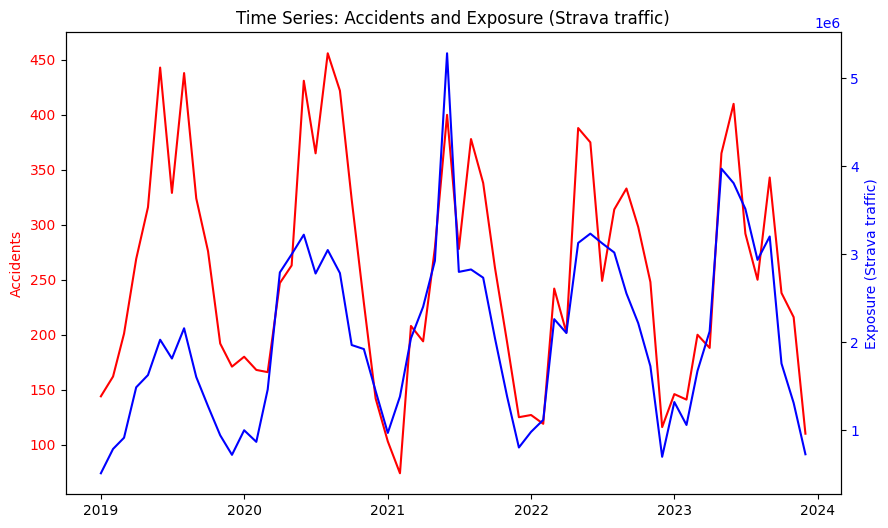

Time-aggregated correlation (spearman):
                 total_accidents  total_exposure
total_accidents         1.000000        0.781422
total_exposure          0.781422        1.000000


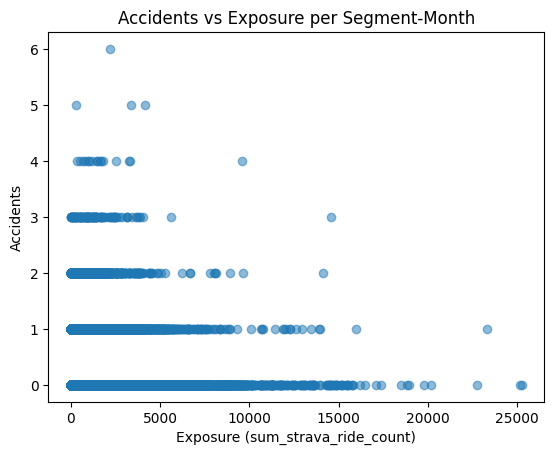

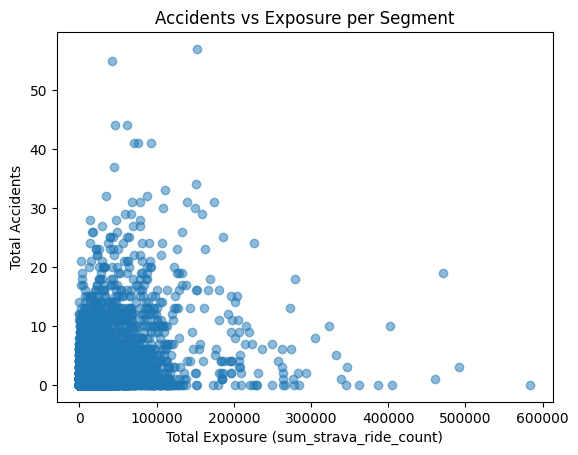

Segment-aggregated correlation (spearman):
                 total_accidents  total_exposure
total_accidents         1.000000        0.409967
total_exposure          0.409967        1.000000


In [13]:
# Time series analysis: accidents and exposure over time
time_agg = df.groupby(['year', 'month']).agg(
    total_accidents=('total_accidents', 'sum'),
    total_exposure=('sum_strava_ride_count', 'sum')
).reset_index()

time_agg['date'] = pd.to_datetime(time_agg[['year', 'month']].assign(day=1))

# Plot time series
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.plot(time_agg['date'], time_agg['total_accidents'], label='Total Accidents', color='red')
ax1.set_ylabel('Accidents', color='red')
ax1.tick_params(axis='y', labelcolor='red')

ax2 = ax1.twinx()
ax2.plot(time_agg['date'], time_agg['total_exposure'], label='Total Exposure (Strava traffic)', color='blue')
ax2.set_ylabel('Exposure (Strava traffic)', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

plt.title('Time Series: Accidents and Exposure (Strava traffic)')
plt.show()

# Correlation check
corr_time = time_agg[['total_accidents', 'total_exposure']].corr(method='spearman')
print("Time-aggregated correlation (spearman):")
print(corr_time)

# Scatter plot: accidents vs exposure per segment-month
plt.scatter(df['sum_strava_ride_count'], df['total_accidents'], alpha=0.5)
plt.xlabel('Exposure (sum_strava_ride_count)')
plt.ylabel('Accidents')
plt.title('Accidents vs Exposure per Segment-Month')
plt.show()


# Scatter plot: accidents vs exposure per segment
segment_agg_scatter = df.groupby('counter_name').agg(
    total_accidents=('total_accidents', 'sum'),
    total_exposure=('sum_strava_ride_count', 'sum')
).reset_index()

plt.scatter(segment_agg_scatter['total_exposure'], segment_agg_scatter['total_accidents'], alpha=0.5)
plt.xlabel('Total Exposure (sum_strava_ride_count)')
plt.ylabel('Total Accidents')
plt.title('Accidents vs Exposure per Segment')
plt.show()

# Correlation check
corr_time = segment_agg_scatter[['total_accidents', 'total_exposure']].corr(method='spearman')
print("Segment-aggregated correlation (spearman):")
print(corr_time)



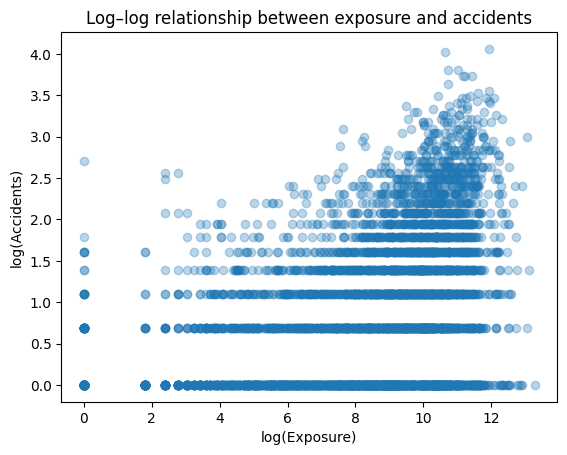

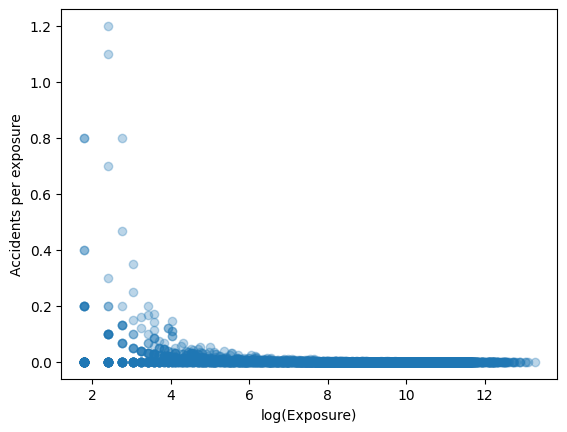

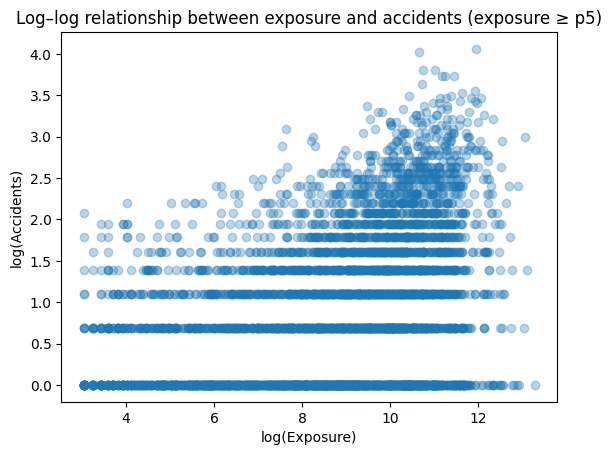

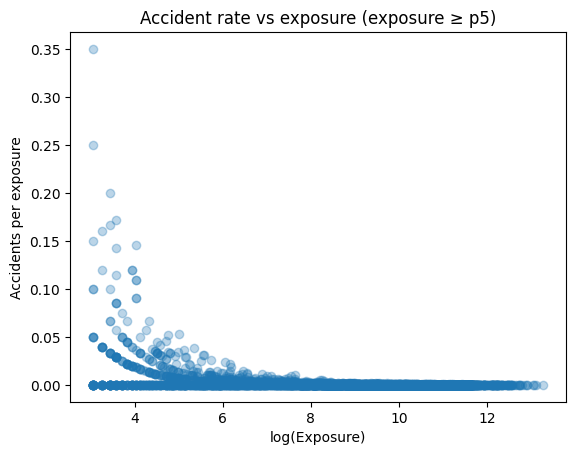

In [19]:
plt.scatter(
    np.log1p(segment_agg_scatter['total_exposure']),
    np.log1p(segment_agg_scatter['total_accidents']),
    alpha=0.3
)
plt.xlabel("log(Exposure)")
plt.ylabel("log(Accidents)")
plt.title("Log–log relationship between exposure and accidents") 
plt.show()


segment_agg_scatter['accident_rate'] = (
    segment_agg_scatter['total_accidents'] /
    segment_agg_scatter['total_exposure'].replace(0, np.nan)
)
plt.scatter(
    np.log1p(segment_agg_scatter['total_exposure']),
    segment_agg_scatter['accident_rate'],
    alpha=0.3
)
plt.xlabel("log(Exposure)")
plt.ylabel("Accidents per exposure")
plt.show()


exp_p5 = segment_agg_scatter['total_exposure'].quantile(0.05)

# Filter data to exclude low exposure segments
df_filt = segment_agg_scatter[
    segment_agg_scatter['total_exposure'] >= exp_p5
].copy()

plt.scatter(
    np.log1p(df_filt['total_exposure']),
    np.log1p(df_filt['total_accidents']),
    alpha=0.3
)
plt.xlabel("log(Exposure)")
plt.ylabel("log(Accidents)")
plt.title("Log–log relationship between exposure and accidents (exposure ≥ p5)")
plt.show()
df_filt['accident_rate'] = (
    df_filt['total_accidents'] /
    df_filt['total_exposure']
)

plt.scatter(
    np.log1p(df_filt['total_exposure']),
    df_filt['accident_rate'],
    alpha=0.3
)
plt.xlabel("log(Exposure)")
plt.ylabel("Accidents per exposure")
plt.title("Accident rate vs exposure (exposure ≥ p5)")
plt.show()




### Log-transforming exposure reveals an increase in accident counts, while normalizing by exposure shows that accident rates decline with increasing traffic volume. This indicates that high-exposure segments are not the primary drivers of cycling accident risk.

# Check segments with top exposure and accidents

In [7]:
# Sanity check: top segments by exposure and accidents
n_top = 50
top_exposure = df.groupby('counter_name')['sum_strava_ride_count'].sum().nlargest(n_top)
top_accidents = df.groupby('counter_name')['total_accidents'].sum().nlargest(n_top)

print("Top 10 segments by exposure:")
print(top_exposure[:10])

print("Top 10 segments by accidents:")
print(top_accidents[:10])

# Check if high exposure segments have high accidents
common = set(top_exposure.index).intersection(set(top_accidents.index))
print(f"\nSegments in both top {n_top} exposure and accidents: {len(common)}")

Top 10 segments by exposure:
counter_name
streetsegment_1315    584215.0
streetsegment_172     491685.0
streetsegment_1766    470790.0
streetsegment_763     461035.0
streetsegment_1404    405580.0
streetsegment_4327    401755.0
streetsegment_1406    386845.0
streetsegment_1396    362485.0
streetsegment_1316    346370.0
streetsegment_701     345425.0
Name: sum_strava_ride_count, dtype: float64
Top 10 segments by accidents:
counter_name
streetsegment_2494    57.0
streetsegment_3573    55.0
streetsegment_1932    44.0
streetsegment_3464    44.0
streetsegment_2223    41.0
streetsegment_2236    41.0
streetsegment_3295    41.0
streetsegment_2139    37.0
streetsegment_3173    34.0
streetsegment_4691    33.0
Name: total_accidents, dtype: float64

Segments in both top 50 exposure and accidents: 1


# Time series analysis for top segments by exposure

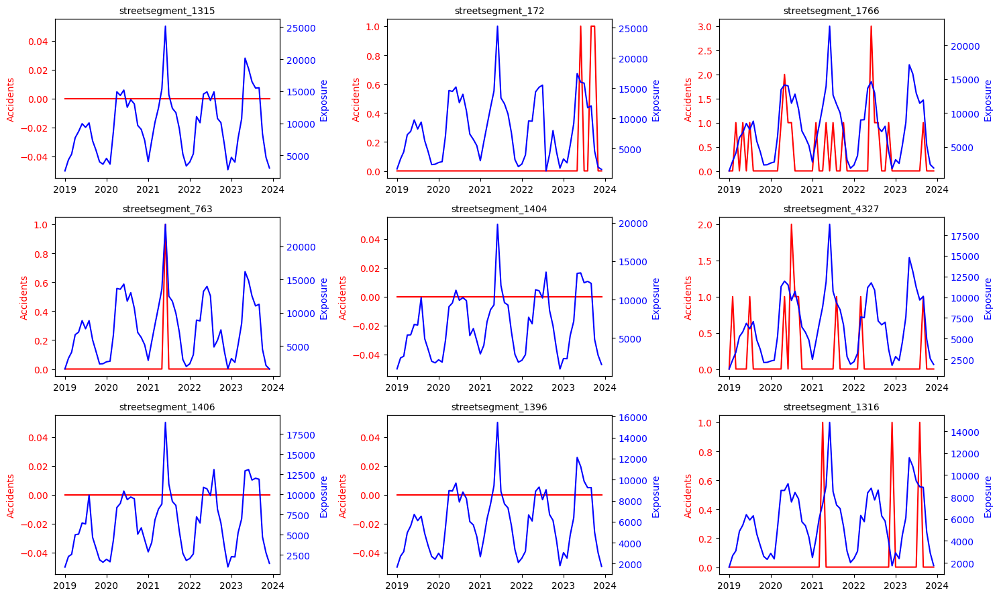

In [8]:
# Time series analysis for top 10 segments by exposure
import matplotlib.pyplot as plt

# Use the top 10 segments from the previous sanity check
top_segments = top_exposure.index[:9]

# Number of subplots
n = len(top_segments)
cols = 3  # 5 columns
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 3*rows))
axes = axes.flatten()

for i, segment in enumerate(top_segments):
    seg_data = df[df['counter_name'] == segment].groupby(['year', 'month']).agg(
        total_accidents=('total_accidents', 'sum'),
        total_exposure=('sum_strava_ride_count', 'sum')
    ).reset_index()
    seg_data['date'] = pd.to_datetime(seg_data[['year', 'month']].assign(day=1))
    
    ax = axes[i]
    ax.plot(seg_data['date'], seg_data['total_accidents'], label='Accidents', color='red')
    ax.set_ylabel('Accidents', color='red')
    ax.tick_params(axis='y', labelcolor='red')
    
    ax2 = ax.twinx()
    ax2.plot(seg_data['date'], seg_data['total_exposure'], label='Exposure', color='blue')
    ax2.set_ylabel('Exposure', color='blue')
    ax2.tick_params(axis='y', labelcolor='blue')
    
    ax.set_title(f'{segment}', fontsize=10)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# Time series analysis for top segments by accidents

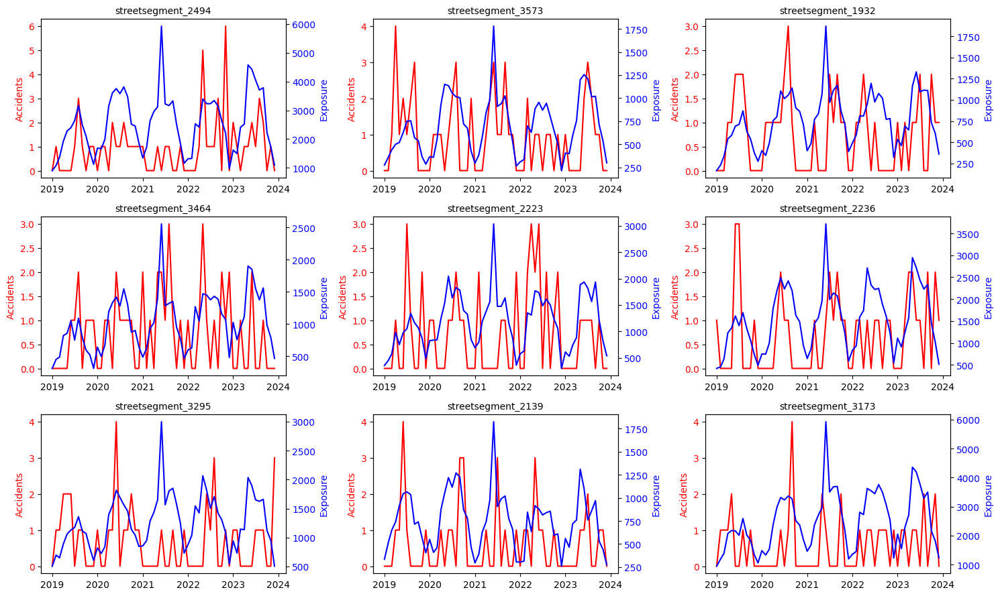

In [ ]:
# Time series analysis for top segments by accidents
# Use the top 10 segments from the previous sanity check
top_segments = top_accidents.index[:9]

# Number of subplots
n = len(top_segments)
cols = 3  # 3 columns
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 3*rows))
axes = axes.flatten()

for i, segment in enumerate(top_segments):
    seg_data = df[df['counter_name'] == segment].groupby(['year', 'month']).agg(
        total_accidents=('total_accidents', 'sum'),
        total_exposure=('sum_strava_ride_count', 'sum')
    ).reset_index()
    seg_data['date'] = pd.to_datetime(seg_data[['year', 'month']].assign(day=1))
    
    ax = axes[i]
    ax.plot(seg_data['date'], seg_data['total_accidents'], label='Accidents', color='red')
    ax.set_ylabel('Accidents', color='red')
    ax.tick_params(axis='y', labelcolor='red')
    
    ax2 = ax.twinx()
    ax2.plot(seg_data['date'], seg_data['total_exposure'], label='Exposure', color='blue')
    ax2.set_ylabel('Exposure', color='blue')
    ax2.tick_params(axis='y', labelcolor='blue')
    
    ax.set_title(f'{segment}', fontsize=10)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

While exposure and accidents are correlated over time, this relationship weakens substantially at the segment level. High-traffic segments are rarely the most accident-prone ones.

In [ ]:
# Aggregate data

segment_agg = df.groupby('counter_name').agg(
    exposure=('sum_strava_ride_count', 'sum'),
    accidents=('total_accidents', 'sum'),
    geometry=('geometry', 'first')
).reset_index()

segment_agg = gpd.GeoDataFrame(segment_agg, geometry='geometry', crs=df.crs)
segment_agg = segment_agg.to_crs('EPSG:4326')


# Exposure color scale 

exp_min = segment_agg['exposure'].min()
exp_max = segment_agg['exposure'].quantile(0.95)

exp_cmap = cm.LinearColormap(
    colors=[
        '#c6dbef',  
        '#6baed6',
        '#2171b5',
        '#08306b'   
    ],
    vmin=exp_min,
    vmax=exp_max
)
exp_cmap.caption = 'Exposure (Strava ride count)'

# Accident color scale

acc_min = segment_agg['accidents'].min()
acc_max = segment_agg['accidents'].quantile(0.95)

acc_cmap = cm.LinearColormap(
    colors=[
        '#fee8c8',  
        '#fdbb84',
        '#e34a33',
        '#7f0000'   
    ],
    vmin=acc_min,
    vmax=acc_max
)


# Map


m = folium.Map(location=[52.52, 13.405], zoom_start=11)

for _, row in segment_agg.iterrows():

    if row.geometry.geom_type != 'LineString' or row.geometry.is_empty:
        continue

    coords = [(y, x) for x, y in row.geometry.coords]

    # Exposure line 
    folium.PolyLine(
        coords,
        color=exp_cmap(row.exposure),
        weight=4,
        opacity=0.95,
        popup=(
            f"<b>Segment:</b> {row.counter_name}<br>"
            f"<b>Exposure:</b> {int(row.exposure)}<br>"
            f"<b>Accidents:</b> {int(row.accidents)}"
        )
    ).add_to(m)

    # Accident marker 
    if row.accidents > 0:
        mid = row.geometry.interpolate(0.5, normalized=True)

        folium.CircleMarker(
            location=[mid.y, mid.x],
            radius=5 + 3 * np.log1p(row.accidents),
            color='#3d0000',                 
            weight=1.5,
            fill=True,
            fill_color=acc_cmap(row.accidents),
            fill_opacity=0.9,
            popup=f"Accidents: {int(row.accidents)}"
        ).add_to(m)


# Legends and output


m.add_child(exp_cmap)
display(m)
m.save("berlin_exposure_blue_accidents_clear.html")
